In [1]:
from astropy.io import fits

import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np

import os
os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = '0.15'

jax.config.update("jax_enable_x64", True)

## Reading and Displaying Fits File

In [2]:
def process_image(image, scale_factor=1, offset=1):
    scaled_image = (image[::scale_factor, ::scale_factor])[1::, 1::]
    cropped_image = image[70:210, 70:210]
    def safe_float32_conversion(value):
        try:
            return np.float32(value)
        except (ValueError, TypeError):
            print("This value is unjaxable: " + str(value))
    fin_image = np.nan_to_num(cropped_image)
    fin_image = np.vectorize(safe_float32_conversion)(fin_image)
    return fin_image

Filename: Fits/aumic_H_pol.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     482   ()      
  1  SCI           1 ImageHDU       140   (281, 281, 4)   float32   
  2  DQ            3 ImageHDU        64   (281, 281, 2)   uint8   


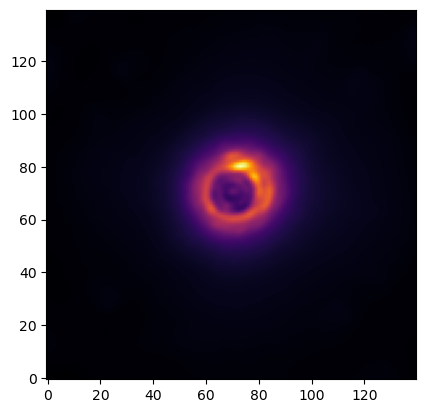

In [3]:
fits_image_filepath = "Fits/aumic_H_pol.fits"
hdul = fits.open(fits_image_filepath)

#Displays File Info
hdul.info()

# Gets Image
image = process_image(hdul['SCI'].data[0,:,:])

# Displays Image
plt.imshow(image, origin='lower', cmap='inferno')

## Displaying All Fits Files

In [4]:

fnames = os.listdir("Fits/")
print(fnames)

scale_factor = 1
images = []
ignore_fits = ['systempsf.fits']

for fname in fnames:
    if(fname in ignore_fits):
        continue
    hdul = fits.open("Fits/"+fname)
    image = process_image(hdul['SCI'].data[1,:,:])
    images.append(image)

['hd145560_H_pol.fits', 'hd146897_H_pol.fits', 'ceant_H_pol.fits', 'hd61005_H_pol.fits', 'systempsf.fits', 'hd111520_H_pol.fits', 'hd115600_H_pol.fits', 'hd129590_H_pol.fits', 'hd117214_H_pol.fits', 'betpic_H_pol.fits', 'hd35841_H_pol.fits', 'hd30447_H_pol.fits', 'hr7012_H_pol.fits', 'hd32297_H_pol.fits', 'hd110058_H_pol.fits', 'hd111161_H_pol.fits', 'hd157587_H_pol.fits', 'hr4796a_H_pol.fits', 'aumic_H_pol.fits', 'hd143675_H_pol.fits', 'hd131835_H_pol.fits', 'hd106906_H_pol.fits', 'hd114082_H_pol.fits', 'hd191089_H_pol.fits', 'hd156623_H_pol.fits']


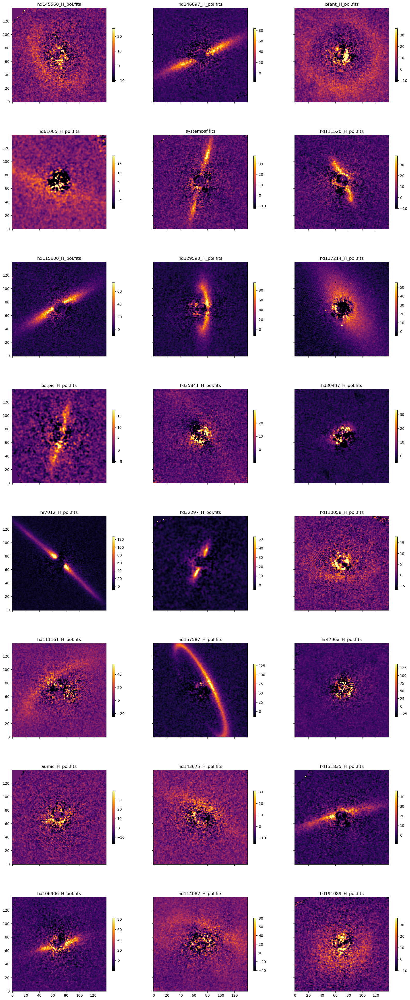

In [5]:
fig, axes = plt.subplots(8,3, sharex=True, sharey=True, figsize = (20,50))

for i in range(0, 8):
    for j in range(0, 3):

        ## Get a good scaling for the images
        y, x = np.indices(images[3*i+j].shape)
        y -= 70
        x -= 70 
        rads = np.sqrt(x**2+y**2)
        mask = (rads > 12)

        vmin = np.percentile(images[3*i+j][mask], 1)
        vmax = np.percentile(images[3*i+j][mask], 99.9)

        im = axes[i][j].imshow(images[3*i+j], origin='lower', cmap='inferno',vmin=vmin, vmax=vmax)
        axes[i][j].set_title(fnames[3*i+j])
        plt.colorbar(im,ax=axes[i][j], shrink=0.5)

## Fitting Disk Models to Fits Images

In [6]:
from disk_utils_jax import jax_model_all_1d, jax_model
from regression import log_likelihood_1d_pos_all_pars_spline
from scipy.optimize import minimize
from SLD_utils import *

In [7]:
# Creating error map
def create_circular_err_map(image_shape, iradius, oradius, noise_level):
    err_map = jnp.zeros(image_shape)
    center = image_shape[0]/2
    y, x = jnp.ogrid[:image_shape[0], :image_shape[1]]
    distance = jnp.sqrt((x - center) ** 2 + (y - center) ** 2)  
    err_map = jnp.where(distance <= oradius, noise_level, 1e8)
    err_map = jnp.where(distance >= iradius, err_map, 1e8)
    return err_map

## Fitting All Disks

In [8]:
from regression import log_likelihood_image
from optimize import quick_optimize_full_opt, quick_image_full_opt, quick_optimize_cent, quick_image_cent, quick_image_full_opt_knots, quick_optimize_full_opt_knots
from datetime import datetime

def create_empirical_err_map(data, annulus_width=5, mask_rad=9, outlier_pixels=None):    
    y,x = np.indices(data.shape)
    y -= data.shape[0]//2
    x -= data.shape[1]//2 
    radii = np.sqrt(x**2 + y**2) 
    noise_array = np.zeros_like(data)
    for i in range(0, int(np.max(radii)//annulus_width) ): 
        indices = (radii > i*annulus_width) & (radii <= (i+1)*annulus_width) 
        noise_array[indices] = np.nanstd(data[indices])
    mask = radii <= mask_rad
    noise_array[mask] = 0

    if(outlier_pixels != None):
        for pixel in outlier_pixels:
            noise_array[pixel[0]][pixel[1]] = noise_array[pixel[0]][pixel[1]] * 1e6 

    return noise_array

def process_image(image, scale_factor=1, offset=1):
    scaled_image = (image[::scale_factor, ::scale_factor])[1::, 1::]
    cropped_image = image[70:210, 70:210]
    def safe_float32_conversion(value):
        try:
            return np.float32(value)
        except (ValueError, TypeError):
            print("This value is unjaxable: " + str(value))
    fin_image = np.nan_to_num(cropped_image)
    fin_image = np.vectorize(safe_float32_conversion)(fin_image)
    return fin_image

def get_inc_bounded_knots(inclination, radius, buffer = 0, num_knots=-1):
    if(num_knots <= 0):
        if(radius < 50):
            num_knots = 4
        else:
            num_knots = 6
    return jnp.linspace(jnp.cos(jnp.deg2rad(90-inclination-buffer)), jnp.cos(jnp.deg2rad(90+inclination+buffer)), num_knots)



In [9]:
def produce_image_fit(name, target_image, err_map, radius, inclination, position_angle, distance, iters = 1000, method = None, full = False,
                      disp=False, dispTime=False, knots = None, plot = True, full_soln = False):
    opt_fun = quick_optimize_cent
    image_fun = quick_image_cent

    ## Get a good scaling
    y, x = np.indices(target_image.shape)
    y -= 70
    x -= 70 
    rads = np.sqrt(x**2+y**2)
    mask = (rads > 12)

    if (knots == None):
        knots = get_inc_bounded_knots(inclination, radius, buffer = 0)

    init_knot_guess = DoubleHenyeyGreenstein_SPF.compute_phase_function_from_cosphi([0.5, 0.5, 0.5], knots)
    init_disk_guess = jnp.array([5., -5., radius, inclination, position_angle])
    init_cent_guess = jnp.array([70., 70.])
    init_guess = None

    if(full):
        opt_fun = quick_optimize_full_opt
        image_fun = quick_image_full_opt
        distr_guess = jnp.array([0, 3, 2, 1])
        init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess])
    else:
        init_guess = jnp.concatenate([init_cent_guess, init_disk_guess, init_knot_guess])

    init_image = image_fun(init_guess, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance, knots=knots)

    if inclination > 70: 
        knot_scale = 1.*np.nanpercentile(target_image[mask], 99) / jnp.nanmax(init_image)
    else: 
        knot_scale = 0.2*np.nanpercentile(target_image[mask], 99) / jnp.nanmax(init_image)
        
    init_knot_guess = DoubleHenyeyGreenstein_SPF.compute_phase_function_from_cosphi([0.5, 0.5, 0.5], knots) * knot_scale
    init_disk_guess = jnp.array([5., -5., radius, inclination, position_angle])
    init_cent_guess = jnp.array([70., 70.])
    init_guess = None

    if(full):
        opt_fun = quick_optimize_full_opt
        image_fun = quick_image_full_opt
        distr_guess = jnp.array([0, 3, 2, 1])
        init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess])
    else:
        init_guess = jnp.concatenate([init_cent_guess, init_disk_guess, init_knot_guess])

    init_image = image_fun(init_guess, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance, knots=knots)
    init_ll = log_likelihood_image(init_image, target_image, err_map)

    # 0: alpha_in, 1: alpha_out, 2: sma, 3: inclination, 4: position_angle, 5: xc, 6: yc, 7: e, 8: ksi, 9: gamma, 10: beta
    start = datetime.now()
    soln = opt_fun(target_image, err_map, init_params=init_guess, method = method, iters = iters, PSFModel=EMP_PSF, pxInArcsec=0.01414, distance = distance, knots = knots, full_soln=True, disp=False)
    end = datetime.now()

    if(disp):
        print(soln)

    if(dispTime):
        print("Time taken: " + str(end-start))

    if plot:

        cent_image = image_fun(soln.x, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance, knots=knots)

        fig, axes = plt.subplots(2,3, figsize=(20,10))

        vmin = np.nanpercentile(target_image[mask], 1)
        vmax = np.nanpercentile(target_image[mask], 99.9)

        # Data
        im = axes[0][0].imshow(target_image, origin='lower', cmap='inferno')
        axes[0][0].set_title("Original Image")
        plt.colorbar(im, ax=axes[0][0], shrink=0.75)
        im.set_clim(vmin, vmax)

        # Error Map
        im = axes[0][1].imshow(err_map, origin='lower', cmap='inferno')
        axes[0][1].set_title("Error Map")
        plt.colorbar(im, ax=axes[0][1], shrink=0.75)
        im.set_clim(vmin, vmax)

        # Signal to Noise Ratio
        with np.errstate(divide='ignore', invalid='ignore'):  # Avoiding divide by 0 warnings
            snr = np.divide(target_image, err_map)
            snr[err_map == 0] = 0
        im = axes[0][2].imshow(snr, origin='lower', cmap='inferno')
        axes[0][2].set_title("SNR Ratio")
        plt.colorbar(im, ax=axes[0][2], shrink=0.75)
        im.set_clim(vmin, vmax)

        # Initial Guess
        im = axes[1][0].imshow(init_image, origin='lower', cmap='inferno')
        axes[1][0].set_title("Initial Guess: "+str(round(-init_ll, 2)))
        plt.colorbar(im, ax=axes[1][0], shrink=0.75)
        im.set_clim(vmin, vmax)

        # Fitted Disk
        im = axes[1][1].imshow(cent_image, origin='lower', cmap='inferno')
        axes[1][1].set_title("Fitted Disk: "+str(round(soln.fun, 2)))
        plt.colorbar(im, ax=axes[1][1], shrink=0.75)
        im.set_clim(vmin, vmax)

        # Residual of Fit to Data
        im = axes[1][2].imshow(target_image-cent_image, origin='lower', cmap='inferno')
        axes[1][2].set_title("Residual")
        plt.colorbar(im, ax=axes[1][2], shrink=0.75)
        im.set_clim(vmin, vmax)

        fig.suptitle(name + ", Convergence: " + str(soln.success))

    if full_soln:
        return soln

    return soln.x

### Loading Files

In [10]:
import pandas as pd

image_data = pd.read_csv('image_info_filt.csv')
image_data.set_index("Name", inplace=True)
image_data.columns = ["Radius", "Inclination", "Position Angle", "Distance", "Knots"]
print(image_data)

                Radius  Inclination  Position Angle  Distance  Knots
Name                                                                
hd145560_H_pol    85.3         43.9           221.5    120.44     17
hd146897_H_pol    85.0         84.0           293.9    131.50      9
ceant_H_pol       29.8         13.1           271.0     34.03     11
hd111520_H_pol    81.0         88.0           165.0    108.94      7
hd115600_H_pol    46.0         80.0            27.5    109.62      5
hd129590_H_pol    66.9         75.7           121.7    136.04      5
hd117214_H_pol    60.2         71.0           359.8    107.61     11
hd35841_H_pol     60.3         84.9           345.8    103.68     11
hd30447_H_pol     83.0         83.0            32.3     80.54     19
hd32297_H_pol     98.4         88.4            47.9    132.79     13
hd110058_H_pol    39.0         84.0           335.0    129.98      5
hd111161_H_pol    72.4         62.1           263.2    109.43     13
hd157587_H_pol    79.0         70.

### Generate Number of Knots Needed for Each Disk Image

In [11]:
'''def get_pixels(inclination, radius, distance, pxInArcsec=0.01414):
    a = radius / distance / pxInArcsec
    b = radius / distance / pxInArcsec * jnp.cos(jnp.deg2rad(inclination))
    return jnp.pi * (3*(a+b) - jnp.sqrt((3*a+b)*(a+3*b))) / 3'''

'def get_pixels(inclination, radius, distance, pxInArcsec=0.01414):\n    a = radius / distance / pxInArcsec\n    b = radius / distance / pxInArcsec * jnp.cos(jnp.deg2rad(inclination))\n    return jnp.pi * (3*(a+b) - jnp.sqrt((3*a+b)*(a+3*b))) / 3'

In [12]:

'''name = image_data.index[18]
row = image_data.loc[name]

num_knots = int(get_pixels(row["Inclination"], row["Radius"], row["Distance"]) / 5)
if(num_knots % 2 == 0):
    num_knots -= 1'''

'''init_spf_pars = jnp.array([0.5, 0.5, 0.5])
init_disk_guess = jnp.array([5., -5., row["Radius"], row["Inclination"], row["Position Angle"]])

init_image = jax_model_all_1d(DustEllipticalDistribution2PowerLaws, DoubleHenyeyGreenstein_SPF, init_disk_guess, init_spf_pars, 1e6, PSFModel=GAUSSIAN_PSF, distance=row["Distance"])
init_image = init_image * 200 / jnp.nanmax(init_image)

noise_level = 50
noise = np.random.normal(0, noise_level, init_image.shape)

target_image = init_image + noise

err_map = create_empirical_err_map(target_image).astype(jnp.float64) #, outlier_pixels=[(57, 68)]))'''

'''hdul = fits.open("Fits/"+name+".fits")
target_image = process_image(hdul['SCI'].data[1,:,:])
err_map = process_image(create_empirical_err_map(hdul['SCI'].data[2,:,:])).astype(jnp.float64)

ind = 0
min_k = num_knots
min_val = 1e6

for i in range(num_knots, 3, -2):
    print(str(i) + " knots:")
    soln = produce_image_fit(name + ": " + str(i) + " knots", target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"],
                            disp=False, iters=200, method = None, dispTime=True,
                            knots=get_inc_bounded_knots(row["Inclination"], row["Radius"], num_knots=i), plot=False, full_soln=True)
    if(soln.fun <= min_val):
        min_k = i
        min_val = soln.fun
    print("Log-Likelihood: "+str(-soln.fun))
    print("Number of Iterations: " + str(soln.nit))
    ind+=1
    print(str(ind)+" of "+str((num_knots-3)/2)+" done.\n")

print(min_k)'''

'hdul = fits.open("Fits/"+name+".fits")\ntarget_image = process_image(hdul[\'SCI\'].data[1,:,:])\nerr_map = process_image(create_empirical_err_map(hdul[\'SCI\'].data[2,:,:])).astype(jnp.float64)\n\nind = 0\nmin_k = num_knots\nmin_val = 1e6\n\nfor i in range(num_knots, 3, -2):\n    print(str(i) + " knots:")\n    soln = produce_image_fit(name + ": " + str(i) + " knots", target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"],\n                            disp=False, iters=200, method = None, dispTime=True,\n                            knots=get_inc_bounded_knots(row["Inclination"], row["Radius"], num_knots=i), plot=False, full_soln=True)\n    if(soln.fun <= min_val):\n        min_k = i\n        min_val = soln.fun\n    print("Log-Likelihood: "+str(-soln.fun))\n    print("Number of Iterations: " + str(soln.nit))\n    ind+=1\n    print(str(ind)+" of "+str((num_knots-3)/2)+" done.\n")\n\nprint(min_k)'

In [13]:
knots = [17, 9, 11, 7, 5, 5, 11, 11, 19, 13, 5, 13, 15, 21, 15, 13, 5, 15, 13]
print(knots)

[17, 9, 11, 7, 5, 5, 11, 11, 19, 13, 5, 13, 15, 21, 15, 13, 5, 15, 13]


### Testing One Disk

Radius             85.30
Inclination        43.90
Position Angle    221.50
Distance          120.44
Knots              17.00
Name: hd145560_H_pol, dtype: float64


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 1.884831980054456
        x: [ 7.325e+01  7.236e+01 ...  3.804e-04  6.065e-05]
      nit: 133
      jac: [ 2.980e-08 -2.980e-08 ...  1.110e-04  2.019e-04]
 hess_inv: [[ 4.068e+03  1.140e+03 ... -4.346e-01  4.454e-01]
            [ 1.140e+03  1.214e+03 ... -1.173e-01  2.113e-01]
            ...
            [-4.346e-01 -1.173e-01 ...  2.341e-04 -1.382e-04]
            [ 4.454e-01  2.113e-01 ... -1.382e-04  3.299e-04]]
     nfev: 4760
     njev: 190
Time taken: 0:01:01.888177



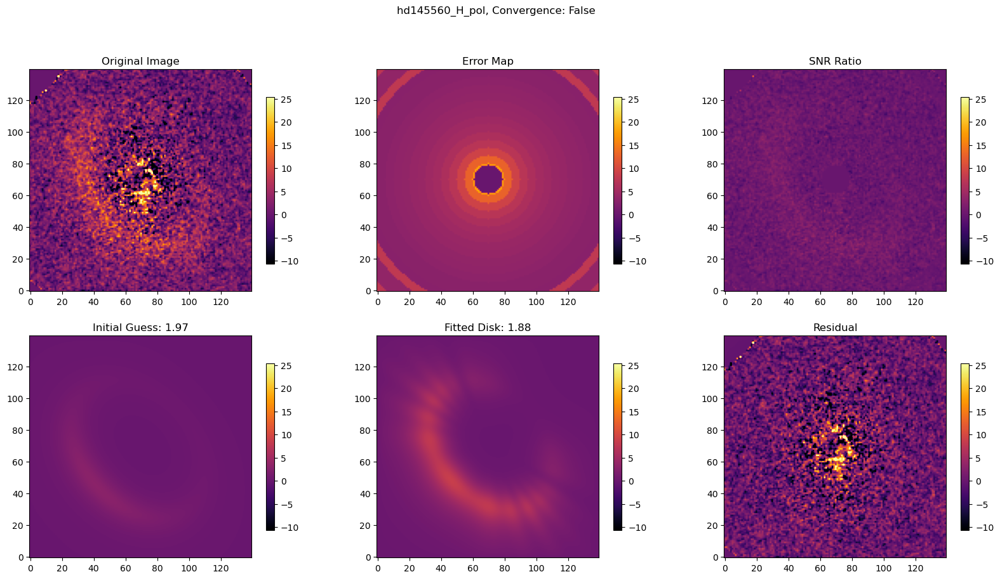

In [14]:
name = image_data.index[0]
row = image_data.loc[name]

hdul = fits.open("Fits/"+name+".fits")
target_image = process_image(hdul['SCI'].data[1,:,:])
err_map = process_image(create_empirical_err_map(hdul['SCI'].data[2,:,:])).astype(jnp.float64) #, outlier_pixels=[(57, 68)]))
print(row)
soln = produce_image_fit(name, target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"],
                         disp=True, iters=1000, method = None, dispTime=True,
                         knots=get_inc_bounded_knots(row["Inclination"], row["Radius"], num_knots=int(row["Knots"])))
print()
#plt.savefig("FitsResults/"+name+'.png')

### Testing all Disks

Radius             85.30
Inclination        43.90
Position Angle    221.50
Distance          120.44
Knots              17.00
Name: hd145560_H_pol, dtype: float64


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Time taken: 0:00:51.548683
[ 7.32468970e+01  7.23617090e+01  5.21515197e+00 -3.28946498e+00
  7.84588783e+01  4.36743657e+01  2.21501193e+02  2.94090272e-03
  2.52143843e-03  2.72420379e-03  1.88959827e-03  2.70389965e-03
  9.86002718e-04  3.02093777e-03  8.34805297e-04  2.41094181e-03
  7.32871855e-04  1.51819591e-03  1.67839065e-04  8.40620843e-04
  7.82262935e-04  6.82309371e-04  3.80433908e-04  6.06497349e-05]
1 out of 19 done

Radius             85.0
Inclination        84.0
Position Angle    293.9
Distance          131.5
Knots               9.0
Name: hd146897_H_pol, dtype: float64


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Time taken: 0:00:56.223417
[ 7.16762102e+01  7.21996037e+01  2.99403623e+00 -1.74927880e+00
  6.71857356e+01  8.26503009e+01  2.93900099e+02  9.42766520e-04
  3.61201297e-03  2.43730569e-03  4.10661195e-03  1.62848876e-03
  1.58315010e-03  1.39739132e-03  1.03255960e-03 -3.26701209e-04]
2 out of 19 done

Radius             29.80
Inclination        13.10
Position Angle    271.00
Distance           34.03
Knots              11.00
Name: ceant_H_pol, dtype: float64


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


KeyboardInterrupt: 

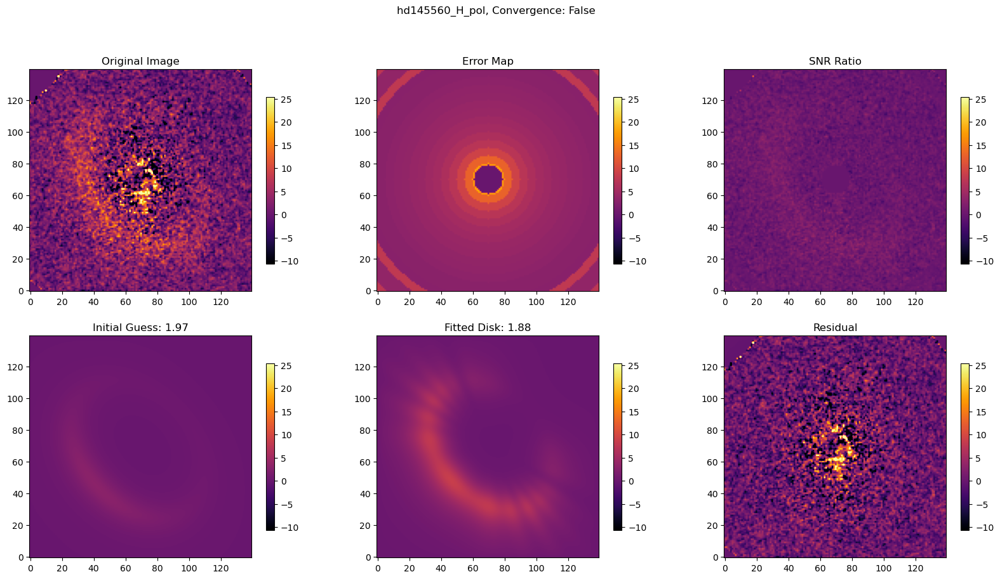

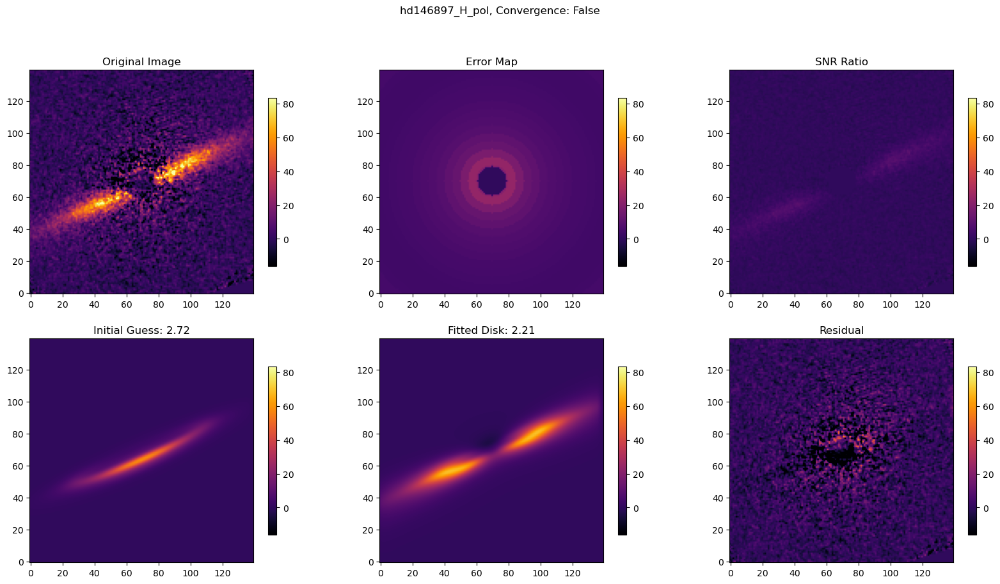

In [15]:
knot_vals = [17, 9, 11, 7, 5, 5, 11, 11, 19, 13, 5, 13, 15, 21, 15, 13, 5, 15, 13]

amnt = len(image_data)
ind = 0

data = pd.DataFrame(columns=['xc', 'yc', 'alpha_in', 'alpha_out',
                             'radius', 'inclination', 'position_angle',
                             'knots'])

def add_row(df, name, row):
    new_row_df = pd.DataFrame([row], columns=df.columns, index=[name])
    df = pd.concat([df, new_row_df])
    df.index = df.index.astype(str)
    return df

for name, row in image_data.iterrows():
    print(row)
    hdul = fits.open("Fits/"+name+".fits")
    target_image = process_image(hdul['SCI'].data[1,:,:])
    err_map = process_image(create_empirical_err_map(hdul['SCI'].data[2,:,:])).astype(jnp.float64)
    soln = produce_image_fit(name, target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"], method = None, full=False,
                             disp = False, dispTime=True,
                             knots=get_inc_bounded_knots(row["Inclination"], row["Radius"], num_knots=int(row["Knots"])))
    print(soln)
    ind+=1
    print(str(ind)+' out of '+str(amnt)+' done')
    print()
    plt.savefig("FitsResults/"+name+'.png')
    data = add_row(data, name, jnp.concatenate([soln[0:7], jnp.array([row["Knots"]])]))

In [ ]:
print(data)
data.to_csv('FitsResults/fits.csv')

                               xc                 yc            alpha_in  \
hd145560_H_pol  73.24689697381423  72.36170900726634   5.215151972671345   
hd146897_H_pol  71.67621022713888  72.19960369019856   2.994036228607452   
ceant_H_pol     71.86779890552984  72.31052622535029   4.594664245917572   
hd111520_H_pol  73.00356645374816  72.81806829534757   5.434086907491939   
hd115600_H_pol  70.00001605947422  70.00001043552994   5.000002848485212   
hd129590_H_pol  70.00000505495402  69.99999633862342   4.999996359040505   
hd117214_H_pol  72.87150770978371  72.60860164122218  11.882687464909452   
hd35841_H_pol   70.73698215234023  71.58459728644017   6.919933753223745   
hd30447_H_pol   73.57898269483353  70.08884192184773   6.012345339498636   
hd32297_H_pol   70.63274256168702   72.2780343461688   19.22510752897822   
hd110058_H_pol  69.00677666269797  73.40109730139172  2.9256744194380597   
hd111161_H_pol  68.93378110061296  66.58200488840477   3.383512757754313   
hd157587_H_p

### Same Thing but with Distribution Parameters as well

In [ ]:
'''data_full = pd.DataFrame(columns=['alpha_in', 'alpha_out',
                             'radius', 'inclination', 'position_angle',
                             'xc', 'yc', 'amin', 'ksi', 'gamma', 'beta',
                             'k1x', 'k2x', 'k3x', 'k4x', 'k5x', 'k6x',
                             'k1y', 'k2y', 'k3y', 'k4y', 'k5y', 'k6y'])

def add_results(df, name, soln, knots):
    rem = jnp.full(6-jnp.size(knots), jnp.nan)
    row = jnp.concatenate([soln[0:11], knots, rem, soln[11:], rem])
    new_row_df = pd.DataFrame([row], columns=df.columns, index=[name])
    df = pd.concat([df, new_row_df])
    df.index = df.index.astype(str)
    return df

ind = 0

for name, row in image_data.iterrows():
    print(row)
    hdul = fits.open("Fits/"+name+".fits")
    target_image = process_image(hdul['SCI'].data[1,:,:])
    err_map = process_image(create_empirical_err_map(hdul['SCI'].data[2,:,:]))
    soln = produce_image_fit(name, target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"], full=True)#, dispTime=True)
    #print(soln)
    ind+=1
    print(str(ind)+' out of '+str(amnt)+' done')
    print()
    #plt.savefig("FitsResults/"+name+'.png')
    data_full = add_results(data_full, name, soln, get_inc_bounded_knots(row['Inclination'], row['Radius']))'''

'data_full = pd.DataFrame(columns=[\'alpha_in\', \'alpha_out\',\n                             \'radius\', \'inclination\', \'position_angle\',\n                             \'xc\', \'yc\', \'amin\', \'ksi\', \'gamma\', \'beta\',\n                             \'k1x\', \'k2x\', \'k3x\', \'k4x\', \'k5x\', \'k6x\',\n                             \'k1y\', \'k2y\', \'k3y\', \'k4y\', \'k5y\', \'k6y\'])\n\ndef add_results(df, name, soln, knots):\n    rem = jnp.full(6-jnp.size(knots), jnp.nan)\n    row = jnp.concatenate([soln[0:11], knots, rem, soln[11:], rem])\n    new_row_df = pd.DataFrame([row], columns=df.columns, index=[name])\n    df = pd.concat([df, new_row_df])\n    df.index = df.index.astype(str)\n    return df\n\nind = 0\n\nfor name, row in image_data.iterrows():\n    print(row)\n    hdul = fits.open("Fits/"+name+".fits")\n    target_image = process_image(hdul[\'SCI\'].data[1,:,:])\n    err_map = process_image(create_empirical_err_map(hdul[\'SCI\'].data[2,:,:]))\n    soln = produce_ima

In [ ]:
'''print(data_full)
data_full.to_csv('fits_full.csv')'''

"print(data_full)\ndata_full.to_csv('fits_full.csv')"

### Now optimizing with spline parameters

In [ ]:
'''def produce_image_fit_knots(name, target_image, err_map, radius, inclination, position_angle, distance, disp=False, dispTime=False, knots = None):

    ## Get a good scaling
    y, x = np.indices(images[3*i+j].shape)
    y -= 70
    x -= 70 
    rads = np.sqrt(x**2+y**2)
    mask = (rads > 12)

    if (knots == None):
        knots = get_inc_bounded_knots(inclination, radius, buffer = 0)

    init_disk_guess = jnp.array([5., -5., radius, inclination, position_angle])
    init_cent_guess = jnp.array([70., 70.])
    distr_guess = jnp.array([0, 3, 2, 1])
    init_knot_guess = DoubleHenyeyGreenstein_SPF.compute_phase_function_from_cosphi([0.5, 0.5, 0.5], knots)
    init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess])

    init_image = quick_image_full_opt(init_guess, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance, knots=knots)

    knot_scale = np.percentile(target_image[mask], 99) / jnp.nanmax(init_image)
    init_knot_guess = DoubleHenyeyGreenstein_SPF.compute_phase_function_from_cosphi([0.5, 0.5, 0.5], knots) * knot_scale

    init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess, knots])

    init_image = quick_image_full_opt_knots(init_guess, jnp.size(knots), PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance, knots=knots)
    init_ll = log_likelihood_image(init_image, target_image, err_map)

    # 0: alpha_in, 1: alpha_out, 2: sma, 3: inclination, 4: position_angle, 5: xc, 6: yc, 7: e, 8: ksi, 9: gamma, 10: beta
    start = datetime.now()
    soln = quick_optimize_full_opt_knots(target_image, err_map, init_params=init_guess, method = None, iters = 1000, PSFModel=EMP_PSF, pxInArcsec=0.01414, distance = distance,
                                            knots = knots, full_soln=True, disp=False)
    end = datetime.now()

    if(disp):
        print(soln)

    if(dispTime):
        print("Time taken: " + str(end-start))

    prod_image = quick_image_full_opt_knots(soln.x, jnp.size(knots), PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance)

    fig, axes = plt.subplots(2,3, figsize=(20,10))

    vmin = np.percentile(target_image[mask], 1)
    vmax = np.percentile(target_image[mask], 99.9)

    # Data
    im = axes[0][0].imshow(target_image, origin='lower', cmap='inferno')
    axes[0][0].set_title("Original Image")
    plt.colorbar(im, ax=axes[0][0], shrink=0.75)
    im.set_clim(vmin, vmax)

    # Error Map
    im = axes[0][1].imshow(err_map, origin='lower', cmap='inferno')
    axes[0][1].set_title("Error Map")
    plt.colorbar(im, ax=axes[0][1], shrink=0.75)
    im.set_clim(vmin, vmax)

    # Signal to Noise Ratio
    with np.errstate(divide='ignore', invalid='ignore'):  # Avoiding divide by 0 warnings
        snr = np.divide(target_image, err_map)
        snr[err_map == 0] = 0
    im = axes[0][2].imshow(snr, origin='lower', cmap='inferno')
    axes[0][2].set_title("SNR Ratio")
    plt.colorbar(im, ax=axes[0][2], shrink=0.75)
    im.set_clim(vmin, vmax)

    # Initial Guess
    im = axes[1][0].imshow(init_image, origin='lower', cmap='inferno')
    axes[1][0].set_title("Initial Guess: "+str(round(-init_ll, 2)))
    plt.colorbar(im, ax=axes[1][0], shrink=0.75)
    im.set_clim(vmin, vmax)

    # Fitted Disk
    im = axes[1][1].imshow(prod_image, origin='lower', cmap='inferno')
    axes[1][1].set_title("Fitted Disk: "+str(round(soln.fun, 2)))
    plt.colorbar(im, ax=axes[1][1], shrink=0.75)
    im.set_clim(vmin, vmax)

    # Residual of Fit to Data
    im = axes[1][2].imshow(target_image-prod_image, origin='lower', cmap='inferno')
    axes[1][2].set_title("Residual")
    plt.colorbar(im, ax=axes[1][2], shrink=0.75)
    im.set_clim(vmin, vmax)

    fig.suptitle(name + ", Convergence: " + str(soln.success))

    return soln.x'''

'def produce_image_fit_knots(name, target_image, err_map, radius, inclination, position_angle, distance, disp=False, dispTime=False, knots = None):\n\n    ## Get a good scaling\n    y, x = np.indices(images[3*i+j].shape)\n    y -= 70\n    x -= 70 \n    rads = np.sqrt(x**2+y**2)\n    mask = (rads > 12)\n\n    if (knots == None):\n        knots = get_inc_bounded_knots(inclination, radius, buffer = 0)\n\n    init_disk_guess = jnp.array([5., -5., radius, inclination, position_angle])\n    init_cent_guess = jnp.array([70., 70.])\n    distr_guess = jnp.array([0, 3, 2, 1])\n    init_knot_guess = DoubleHenyeyGreenstein_SPF.compute_phase_function_from_cosphi([0.5, 0.5, 0.5], knots)\n    init_guess = jnp.concatenate([init_disk_guess, init_cent_guess, distr_guess, init_knot_guess])\n\n    init_image = quick_image_full_opt(init_guess, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = distance, knots=knots)\n\n    knot_scale = np.percentile(target_image[mask], 99) / jnp.nanmax(init_image)\n    ini

In [ ]:
'''name = image_data.index[0]
row = image_data.loc[name]

print(row)
hdul = fits.open("Fits/"+name+".fits")
target_image = process_image(hdul['SCI'].data[1,:,:])
err_map = process_image(create_empirical_err_map(hdul['SCI'].data[2,:,:], outlier_pixels=[(57, 68)]))
soln = produce_image_fit_knots(name, target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"], dispTime=True)
print()
print(soln)'''

'name = image_data.index[0]\nrow = image_data.loc[name]\n\nprint(row)\nhdul = fits.open("Fits/"+name+".fits")\ntarget_image = process_image(hdul[\'SCI\'].data[1,:,:])\nerr_map = process_image(create_empirical_err_map(hdul[\'SCI\'].data[2,:,:], outlier_pixels=[(57, 68)]))\nsoln = produce_image_fit_knots(name, target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"], dispTime=True)\nprint()\nprint(soln)'

## MCMC Model Time!

In [16]:
from mcmc_model import MCMC_model
from regression import log_likelihood_1d_pos_cent

Radius             46.00
Inclination        80.00
Position Angle     27.50
Distance          109.62
Knots               5.00
Name: hd115600_H_pol, dtype: float64


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Time taken: 0:00:32.197912
[ 7.18562773e+01  7.41856775e+01  6.90329750e-01 -8.46962207e+00
  4.95604174e+01  6.34391361e+01  2.75000808e+01  2.37506802e-03
  7.70728800e-04  2.06114758e-03 -2.22653929e-04  1.76448041e-03]


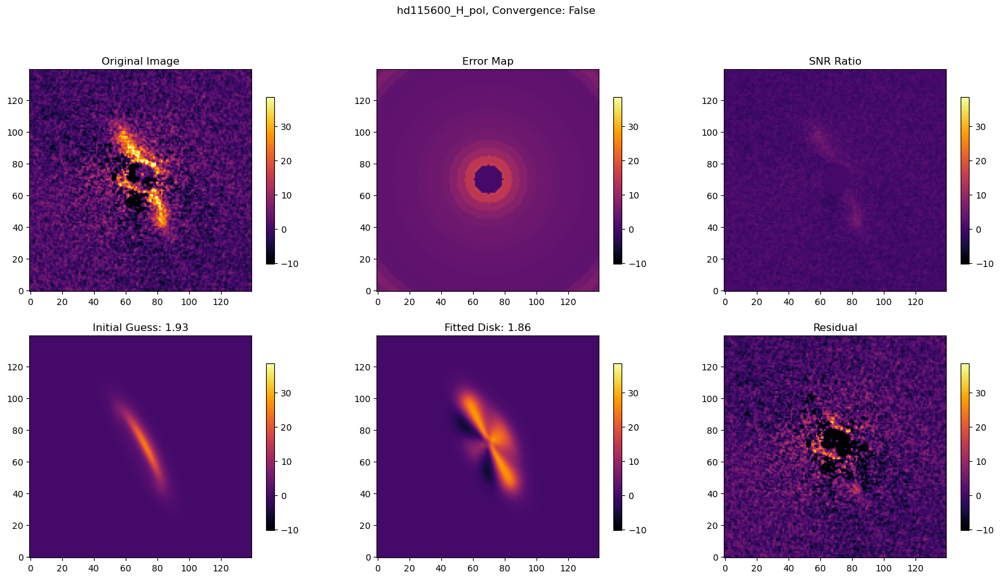

In [79]:
name = image_data.index[4]
row = image_data.loc[name]

print(row)
hdul = fits.open("Fits/"+name+".fits")
target_image = process_image(hdul['SCI'].data[1,:,:])
err_map = process_image(create_empirical_err_map(hdul['SCI'].data[2,:,:]))
soln = produce_image_fit(name, target_image, err_map, row["Radius"], row["Inclination"], row["Position Angle"], row["Distance"],
                         knots=get_inc_bounded_knots(row["Inclination"], row["Radius"], num_knots=int(row["Knots"])), dispTime=True)
print(soln)

#### After Bounds Tweaking

In [80]:
print(soln)

[ 7.18562773e+01  7.41856775e+01  6.90329750e-01 -8.46962207e+00
  4.95604174e+01  6.34391361e+01  2.75000808e+01  2.37506802e-03
  7.70728800e-04  2.06114758e-03 -2.22653929e-04  1.76448041e-03]


In [81]:
DISK_BOUNDS = np.array([np.array([1, -10, 0, 0, 0]), np.array([10, -1, 150, 180, 400])])
CENT_BOUNDS = np.array([np.array([65, 65]), np.array([75, 75])])
SPLINE_BOUNDS = np.array([np.zeros(jnp.size(knots)) - 1e-3, 0.1*np.ones(jnp.size(knots))])
BOUNDS = np.array([np.concatenate([CENT_BOUNDS[0], DISK_BOUNDS[0], SPLINE_BOUNDS[0]]),
                    np.concatenate([CENT_BOUNDS[1], DISK_BOUNDS[1], SPLINE_BOUNDS[1]])])

print(BOUNDS)

[[ 6.5e+01  6.5e+01  1.0e+00 -1.0e+01  0.0e+00  0.0e+00  0.0e+00 -1.0e-03
  -1.0e-03 -1.0e-03 -1.0e-03 -1.0e-03]
 [ 7.5e+01  7.5e+01  1.0e+01 -1.0e+00  1.5e+02  1.8e+02  4.0e+02  1.0e-01
   1.0e-01  1.0e-01  1.0e-01  1.0e-01]]


In [103]:
llp = lambda x: log_likelihood_1d_pos_cent(jnp.concatenate([soln[0:7], x]), 
                    DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                    1e6, target_image, err_map, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = row["Distance"],
                    knots=knots)

bounds = []
for i in range(0, int(row["Knots"])):
    bounds.append((0, 0.1))

ch_soln = jnp.concatenate([soln[0:7], minimize(llp, soln[7:], method='l-bfgs-b', bounds=bounds).x])

print(soln)
print(ch_soln)

[ 7.18562773e+01  7.41856775e+01  1.00000000e+00 -8.46962207e+00
  4.95604174e+01  6.34391361e+01  2.75000808e+01  2.37506802e-03
  7.70728800e-04  2.06114758e-03  1.00000000e-06  1.76448041e-03]
[ 7.18562773e+01  7.41856775e+01  1.00000000e+00 -8.46962207e+00
  4.95604174e+01  6.34391361e+01  2.75000808e+01  2.41441233e-03
  8.42774729e-04  2.13034591e-03  0.00000000e+00  1.36322911e-03]


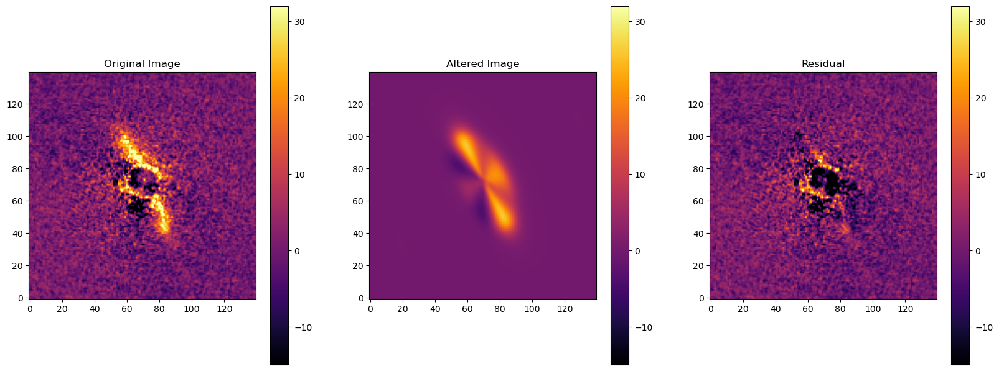

In [104]:

ch_image = quick_image_cent(ch_soln, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = row["Distance"], knots=knots)

fig, axes = plt.subplots(1,3, figsize=(20,10))

im = axes[0].imshow(target_image, origin='lower', cmap='inferno')
axes[0].set_title("Original Image")
plt.colorbar(im, ax=axes[0], shrink=0.75)
im.set_clim(-15, 32)

im = axes[1].imshow(ch_image, origin='lower', cmap='inferno')
axes[1].set_title("Altered Image")
plt.colorbar(im, ax=axes[1], shrink=0.75)
im.set_clim(-15, 32)

im = axes[2].imshow(target_image-ch_image, origin='lower', cmap='inferno')
axes[2].set_title("Residual")
plt.colorbar(im, ax=axes[2], shrink=0.75)
im.set_clim(-15, 32)

In [105]:
for i in range(8, len(soln)):
    if(soln[i] <= 0):
        soln[i] = 0
if(soln[2] < 1):
    soln[2] = 1

knots = get_inc_bounded_knots(row["Inclination"], row["Radius"], num_knots=int(row["Knots"]))
xvals = get_inc_bounded_knots(row["Inclination"], row["Radius"], num_knots=100)

llp = lambda x: -log_likelihood_1d_pos_cent(x, 
                    DustEllipticalDistribution2PowerLaws, InterpolatedUnivariateSpline_SPF, 
                    1e6, target_image, err_map, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = row["Distance"],
                    knots=knots)


DISK_BOUNDS = np.array([np.array([1, -10, 0, 0, 0]), np.array([10, -1, 150, 180, 400])])
CENT_BOUNDS = np.array([np.array([65, 65]), np.array([75, 75])])
SPLINE_BOUNDS = np.array([np.zeros(jnp.size(knots)), 0.1*np.ones(jnp.size(knots))])
BOUNDS = np.array([np.concatenate([CENT_BOUNDS[0], DISK_BOUNDS[0], SPLINE_BOUNDS[0]]),
                    np.concatenate([CENT_BOUNDS[1], DISK_BOUNDS[1], SPLINE_BOUNDS[1]])])

def spline_prior(theta_bounds, theta):
    spline_model = InterpolatedUnivariateSpline_SPF.init(theta[7:], knots=knots)
    if np.all(theta > theta_bounds[0]) and np.all(theta < theta_bounds[1]) and np.all(spline_model(xvals) >= 0):
        return 0
    else:
        return -np.inf

start = datetime.now()
mc_model = MCMC_model(llp, BOUNDS)
mc_model.run(soln, nconst = 1e-7, nwalkers=500, niter=500, burn_iter=100)
end = datetime.now()
print(end-start)

Running burn-in...


/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]


emcee: Exception while calling your likelihood function:
  params: [ 7.18562773e+01  7.41856774e+01  1.00000004e+00 -8.46962222e+00
  4.95604174e+01  6.34391361e+01  2.75000808e+01  2.37510534e-03
  7.70657591e-04  2.06114009e-03  1.04812490e-06  1.76445382e-03]
  args: []
  kwargs: {}
  exception:


Traceback (most recent call last):
  File "/home/mihirkondapalli/anaconda3/lib/python3.11/site-packages/emcee/ensemble.py", line 640, in __call__
    return self.f(x, *self.args, **self.kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/home/mihirkondapalli/sldjax/DiskRegression/mcmc_model.py", line 28, in _lnprob
    return lp + self.fun(theta)
                ^^^^^^^^^^^^^^^
  File "/tmp/ipykernel_3001213/2105891428.py", line 10, in <lambda>
    llp = lambda x: -log_likelihood_1d_pos_cent(x,
                    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
KeyboardInterrupt


KeyboardInterrupt: 

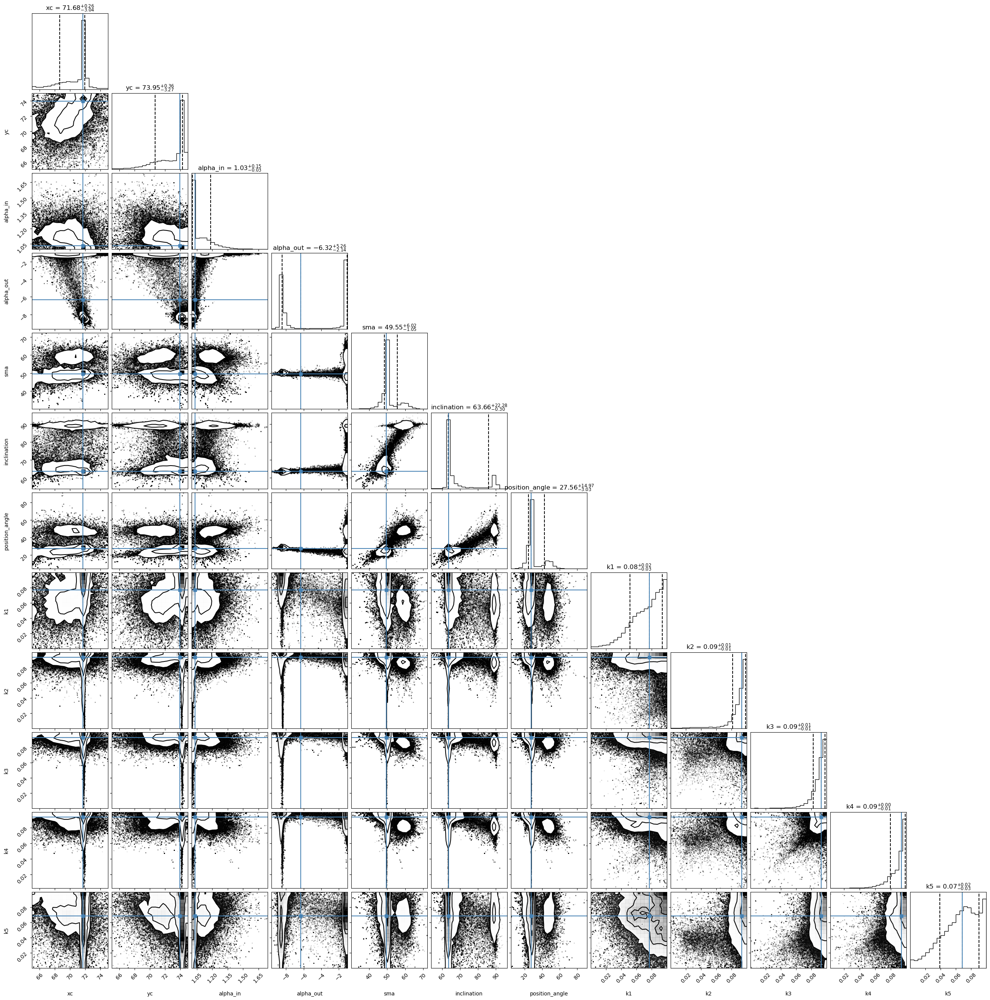

In [ ]:
labels = ['xc', 'yc', 'alpha_in', 'alpha_out', 'sma', 'inclination', 'position_angle']
for i in range(0, jnp.size(knots)):
    labels.append('k'+str(i+1))
#mc_model.show_corner_plot(labels, truths=soln)
mc_model.show_corner_plot(labels, truths=np.median(mc_model.sampler.flatchain, axis=0))

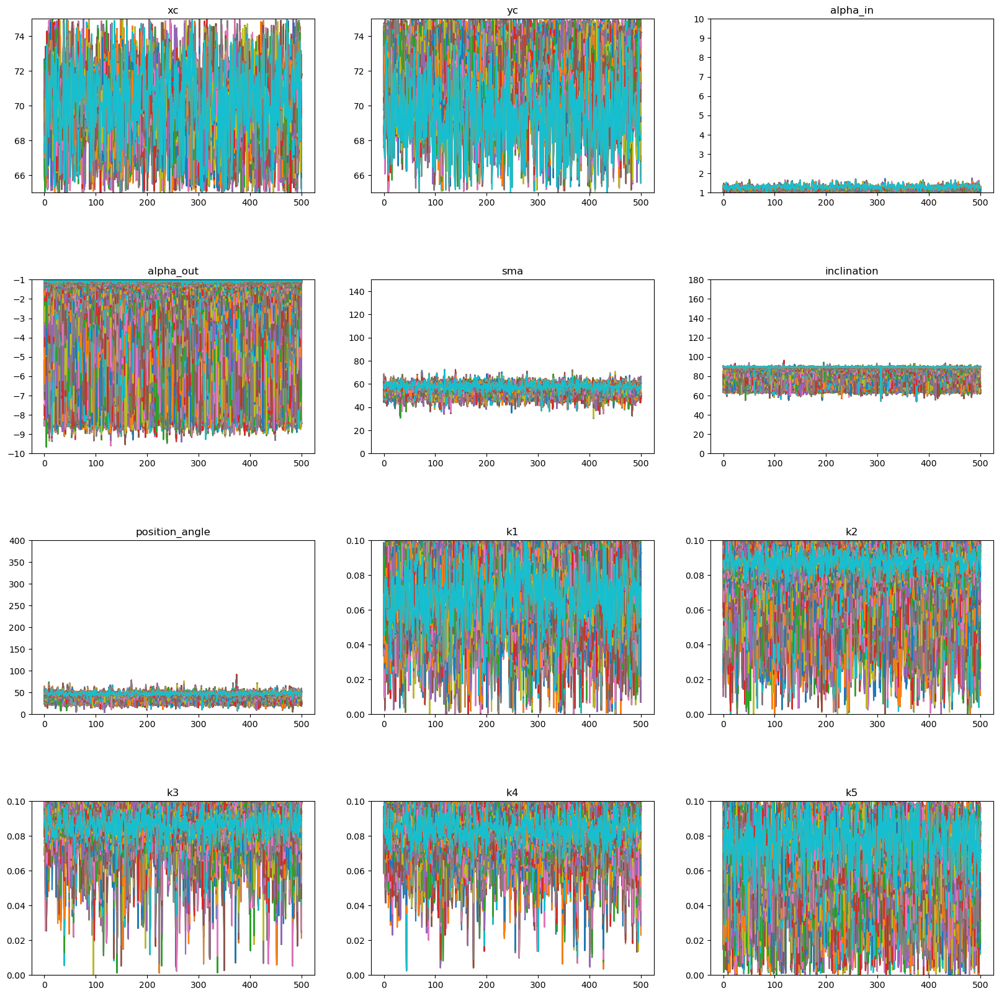

In [ ]:
n_cols = int((len(soln) + 2) / 3)

fig, axes = plt.subplots(n_cols,3, figsize=(20,20))
fig.subplots_adjust(hspace=0.5)

for i in range(0, n_cols):
    for j in range(0, 3):
        axes[i][j].plot(np.linspace(0, 500, 500), mc_model.sampler.get_chain()[:, :, 3*i+j].T)
        axes[i][j].set_ylim(BOUNDS[0][3*i+j], BOUNDS[1][3*i+j])
        axes[i][j].set_title(labels[3*i+j])

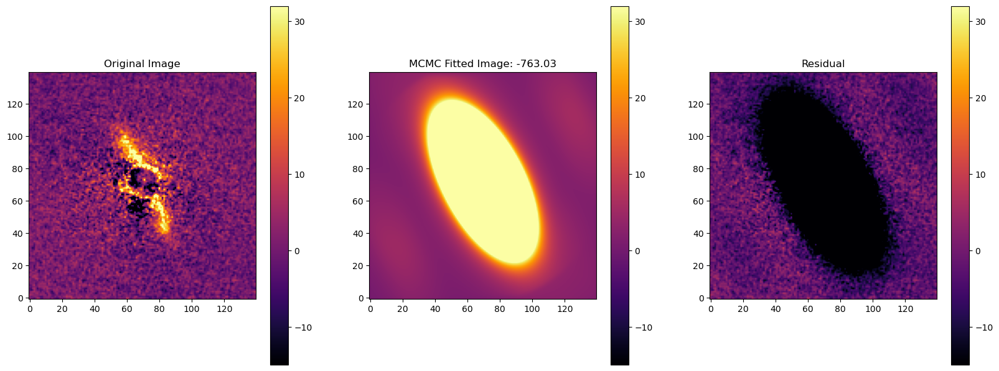

In [ ]:
mc_soln = np.median(mc_model.sampler.flatchain, axis=0)
#mc_soln = mc_model.get_theta_max()
mc_image = quick_image_cent(mc_soln, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = row["Distance"], knots=knots)

fig, axes = plt.subplots(1,3, figsize=(20,10))

im = axes[0].imshow(target_image, origin='lower', cmap='inferno')
axes[0].set_title("Original Image")
plt.colorbar(im, ax=axes[0], shrink=0.75)
im.set_clim(-15, 32)

im = axes[1].imshow(mc_image, origin='lower', cmap='inferno')
axes[1].set_title("MCMC Fitted Image: " + str(round(-llp(mc_soln), 2)))
plt.colorbar(im, ax=axes[1], shrink=0.75)
im.set_clim(-15, 32)

im = axes[2].imshow(target_image-mc_image, origin='lower', cmap='inferno')
axes[2].set_title("Residual")
plt.colorbar(im, ax=axes[2], shrink=0.75)
im.set_clim(-15, 32)

In [ ]:
fig.savefig("mcmc_results/"+name+'.png')

In [ ]:
'''def write_to_fits(filename, data):
    numpy_array = np.array(data)
    hdu = fits.PrimaryHDU(numpy_array)
    hdul = fits.HDUList([hdu])
    hdul.writeto(filename, overwrite=True)


mode2 = np.array([71.3, 73, 4.3, -4.9, 100, 72.8, 60,
                0.00110, 0.00090, 0.00070, 0.00029, 0.0003, 0.0002])
print(mode2)'''

[ 7.13e+01  7.30e+01  4.30e+00 -4.90e+00  1.00e+02  7.28e+01  6.00e+01
  1.10e-03  9.00e-04  7.00e-04  2.90e-04  3.00e-04  2.00e-04]


In [ ]:
'''mode2_image = quick_image_cent(mode2, PSFModel = EMP_PSF, pxInArcsec=0.01414, distance = row["Distance"], knots=knots)

fig, axes = plt.subplots(1,3, figsize=(20,10))

im = axes[0].imshow(target_image, origin='lower', cmap='inferno')
axes[0].set_title("Original Image")
plt.colorbar(im, ax=axes[0], shrink=0.75)
im.set_clim(-15, 32)

im = axes[1].imshow(mode2_image, origin='lower', cmap='inferno')
axes[1].set_title("MCMC Fitted Image: " + str(round(-llp(mode2), 2)))
plt.colorbar(im, ax=axes[1], shrink=0.75)
im.set_clim(-15, 32)

im = axes[2].imshow(target_image-mode2_image, origin='lower', cmap='inferno')
axes[2].set_title("Residual")
plt.colorbar(im, ax=axes[2], shrink=0.75)
im.set_clim(-15, 32)'''

AssertionError: Input arrays must be the same length.

In [ ]:
'''print(np.round(mc_soln[0:7], 2))
print(np.round(mode2[0:7], 2))'''

[ 70.31  70.58   4.95  -3.01 106.86  74.41  60.75]
[ 71.3  73.    4.3  -4.9 100.   72.8  60. ]
